In [1]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.22 GB, difference +0.22 GB
scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [3]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [4]:
home_dir = os.path.expanduser("~")

In [5]:
#home_dir = os.path.expanduser("~")
current_directory = os.getcwd()
adata = sc.read_h5ad(current_directory+"/backups/bb2_bb3_mito_total_counts_filt_doublet_111570x37733_240710_10h50.h5ad")

In [6]:
#Loading obs
current_directory = os.getcwd()
# overwrite obs with the most recent version
filename = current_directory+"/backups/bb2_bb3_leiden_2.5_sub_DGE_v1_annotation_obs_86447x29_241024_10h21.npz"
encoding = "latin1"

with np.load(filename, encoding=encoding, allow_pickle = True) as f:
    obs = pd.DataFrame(**f)

In [7]:
# loading obs onto adata
adata.obs["leiden_2.5_sub"] = obs["leiden_2.5_sub"]
adata.obs["cell_type"] = obs["cell_type"]

In [8]:
#Selecting Neutrophils clusters
adata = adata[adata.obs["leiden_2.5_sub"].isin(["18", "37", "29", "30,0", "30,1", "33,0", "33,1", "36", "38", "19,0", "19,1", "19,2", "19,3", "19,4", "19,5"])]

In [9]:
adata.obs.cell_type.unique()

array(['Mast cells', 'AML cells 1', 'AML cells 4', 'AML cells 3',
       'AML cells 5', 'AML cells 2', 'AML cells 6'], dtype=object)

In [10]:
len(adata)

12062

In [11]:
adata.var["mt"] = adata.var_names.str.startswith(("MT-")) # annotate the group of mitochondrial genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS","RPL")) # annotate the group of ribo genes
#adata.var["hb"] = adata.var_names.str.contains(("GRCh38_^HB[^(P)]")) # hemoglobin genes

# Saving raw (original) counts to layer
adata.layers["counts"] = adata.X.copy()

#save "raw" data (not scalled, not log)
adata.raw = adata

#calculate qc metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], percent_top = None, log1p = False, inplace = True)

#normalize data
sc.pp.normalize_per_cell(adata, counts_per_cell_after = 1e4) # n_counts is created


/var/folders/sv/fwsrf8xs57jd9rtwwfxmyxg80000gn/T/ipykernel_17945/4021811915.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(("MT-")) # annotate the group of mitochondrial genes


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [12]:
adata.layers["counts"].sum(axis = 1)

matrix([[6470.],
        [3131.],
        [6300.],
        ...,
        [4314.],
        [1518.],
        [ 420.]], dtype=float32)

In [13]:
adata.raw.X.sum(axis = 1)

matrix([[6470.],
        [3131.],
        [6300.],
        ...,
        [4314.],
        [1518.],
        [ 420.]], dtype=float32)

In [14]:
adata.X.sum(axis = 1)

matrix([[10000.   ],
        [10000.   ],
        [ 9999.999],
        ...,
        [10000.001],
        [10000.   ],
        [10000.   ]], dtype=float32)

In [15]:
cdata = adata.copy()

In [16]:
# avoid genes starting with
toavoid = ["MT-", "RPS","RPL","MRPL", "MRPS"]
for i in toavoid:
    print(i)
    print([g for g in cdata.var_names if g.startswith(i)])
    print("\n")

MT-
['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']


RPS
['RPS6KA1', 'RPS8', 'RPS27', 'RPS6KC1', 'RPS7', 'RPS27A', 'RPSA', 'RPS3A', 'RPS23', 'RPS14', 'RPS18', 'RPS10-NUDT3', 'RPS10', 'RPS12', 'RPS6KA2', 'RPS6KA2-IT1', 'RPS6KA2-AS1', 'RPS20', 'RPS6', 'RPS24', 'RPS13', 'RPS6KA4', 'RPS6KB2', 'RPS6KB2-AS1', 'RPS3', 'RPS25', 'RPS26', 'RPS29', 'RPS6KL1', 'RPS6KA5', 'RPS27L', 'RPS17', 'RPS2', 'RPS15A', 'RPS6KB1', 'RPS15', 'RPS28', 'RPSAP58', 'RPS16', 'RPS19', 'RPS11', 'RPS9', 'RPS5', 'RPS21', 'RPS19BP1', 'RPS6KA3', 'RPS4X', 'RPS6KA6', 'RPS4Y1', 'RPS4Y2']


RPL
['RPL22', 'RPL11', 'RPL5', 'RPL31', 'RPL37A-DT', 'RPL37A', 'RPL32', 'RPL15', 'RPL14', 'RPL29', 'RPL24', 'RPL22L1', 'RPL39L', 'RPL35A', 'RPL9', 'RPL34-DT', 'RPL34', 'RPL37', 'RPL26L1-AS1', 'RPL26L1', 'RPL10A', 'RPL7L1', 'RPL7', 'RPL30', 'RPL30-AS1', 'RPL8', 'RPL35', 'RPL12', 'RPL7A', 'RPLP2', 'RPL27A', 'RPL41', 'RPL6', 'RPLP0', 'RPL21', 'RPL10L', 'RPL3

In [17]:
filter_genes = ["MT-", "RPS","RPL","MRPL", "MRPS"]

print("before mt and ribo removal: ", cdata.n_obs, cdata.n_vars)

mask_gene_list = []
for gene in filter_genes:
    mask_gene = cdata.var_names.str.startswith(gene)
    mask_gene_list.append(mask_gene)
    #remove = np.add(mask_gene)
    
remove = np.sum(mask_gene_list, axis = 0, dtype = bool) 
keep = np.invert(remove)
keep
cdata = cdata[:,keep]

print("after mt and ribo removal: ", cdata.n_obs, cdata.n_vars)

before mt and ribo removal:  12062 37733
after mt and ribo removal:  12062 37528


In [18]:
######min_cells = 5, min_counts = 10######
# Filtering "noisy" genes
gmask = filter_abund_genes(E = cdata.X, min_cells = 5, min_counts = 10)

12124 genes passing abundance filter


In [19]:
cdata = cdata[:,gmask]

In [20]:
#logaritmize data
sc.pp.log1p(cdata)

/Users/denis/mambaforge/envs/capseq_seurat_v3/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:398: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes


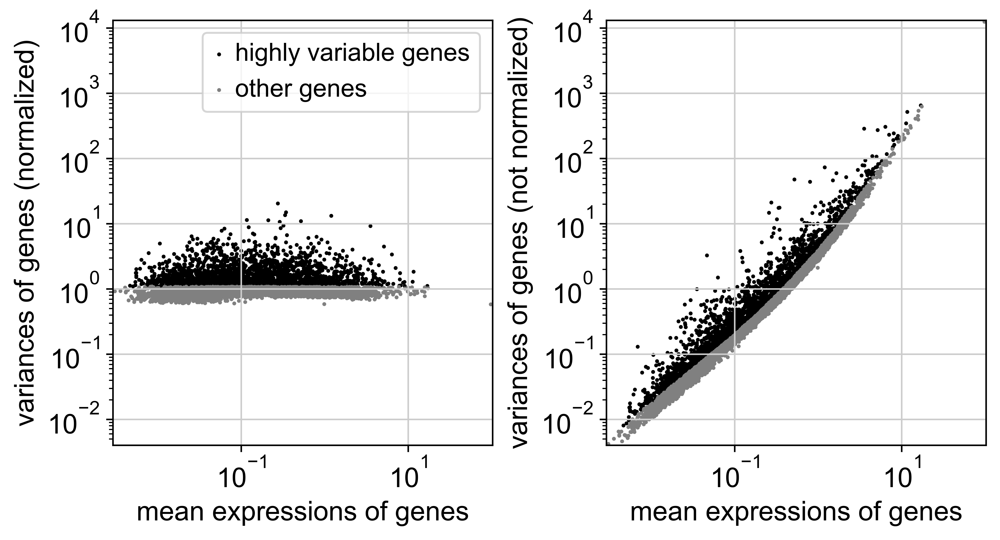

In [21]:
#Identify highly variable genes


sc.pp.highly_variable_genes(cdata, 
                            n_top_genes = 2500, 
                            flavor = "seurat_v3",#_paper", 
                            layer = "counts")


sc.pl.highly_variable_genes(cdata, save = "_seurat_v3_2500_aml_cells.png", log = True)



In [22]:
#Saving hvg to uns
cdata.uns["hvg"] = list(cdata.var.highly_variable.index)
#cdata.uns["hvg"] = cdata.var.highly_variable.copy()
#cdata.uns["hvg"] = list(cdata.uns["hvg"][cdata.uns["hvg"]].index)

In [23]:
#Select only highly variable genes
cdata = cdata[:, cdata.var.highly_variable]

In [24]:
# Z-score
sc.pp.scale(cdata, max_value = 10)

/Users/denis/mambaforge/envs/capseq_seurat_v3/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:299: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [25]:
# find the number of non-random PCs

Z = cdata.X
d = find_num_pc(Z, start_pc = 200, sparse = False)
print ("Number of pc to use for is : "  + str(d["num_pc"]))
# now use the calculated number of PCAs and neighbours for each anndata object

sc.tl.pca(cdata, n_comps = d["num_pc"], svd_solver = "arpack")



calculating the first 200 observed eigenvalues...
calculating the random eigenvalues for 10 rounds of shuffling...
1 	 34 	 0.12 min.
2 	 35 	 0.20 min.
3 	 34 	 0.28 min.
4 	 34 	 0.36 min.
5 	 34 	 0.46 min.
6 	 34 	 0.53 min.
7 	 35 	 0.61 min.
8 	 34 	 0.69 min.
9 	 34 	 0.77 min.
10 	 35 	 0.85 min.
Number of pc to use for is : 34
computing PCA
    with n_comps=34
    finished (0:00:00)


In [28]:
sc.pp.neighbors(cdata, n_neighbors = 15)
sc.tl.umap(cdata, min_dist = 0.3, random_state = 69)

computing neighbors
    using 'X_pca' with n_pcs = 34
    finished (0:00:11)
computing UMAP
    finished (0:00:05)


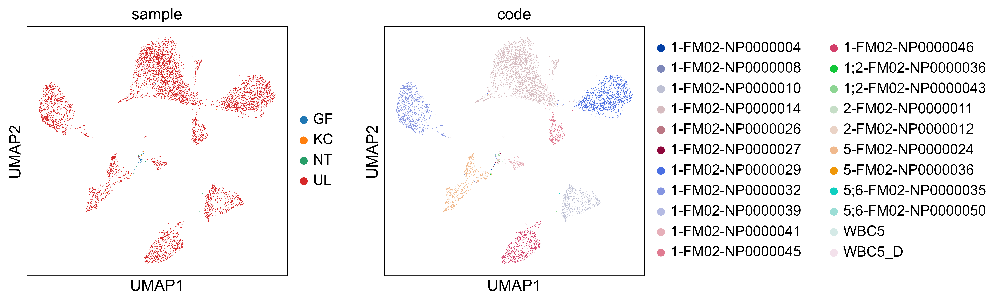

In [29]:
sc.pl.umap(cdata, color = ["sample", "code"], 
           alpha = 1, 
           wspace = 0.25,
           ncols = 2,
           s = 1,
           save = "_no_bach_correction_2500hvg_5cells_10counts_15neighbors_0.3min_dist_filtered_extra_aml_cells_241028.png")


In [30]:
#Batch correction
sc.external.pp.harmony_integrate(cdata, ["code"], max_iter_harmony = 20)
sc.pp.neighbors(cdata, n_neighbors = 15, use_rep = "X_pca_harmony")
sc.tl.umap(cdata, min_dist = 0.3, random_state = 69)


2024-10-28 17:33:26,136 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-10-28 17:33:27,267 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-10-28 17:33:27,322 - harmonypy - INFO - Iteration 1 of 20
2024-10-28 17:33:29,776 - harmonypy - INFO - Iteration 2 of 20
2024-10-28 17:33:32,481 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished (0:00:01)
computing UMAP
    finished (0:00:05)


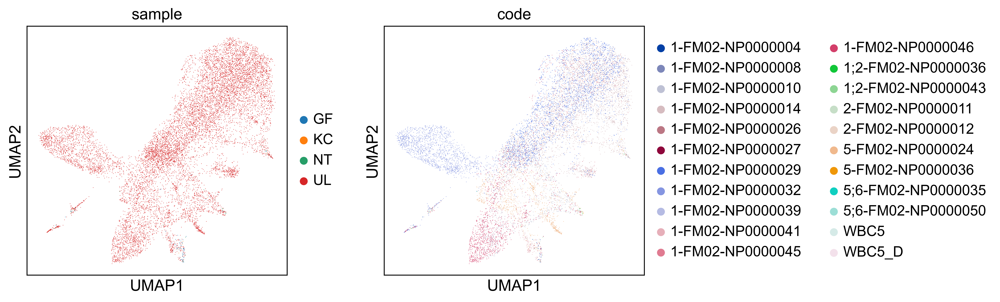

In [31]:
sc.pl.umap(cdata, color = ["sample", "code"], 
           alpha = 1, 
           wspace = 0.25,
           ncols = 2,
           s = 1,
           save = "_bach_correction_2500hvg_5cells_10counts_15neighbors_0.3min_dist_filtered_extra_aml_cells_241028.png")


In [ ]:
# Choosing the best UMAP parameters
neighbor_list = [15, 20, 25, 30]
dist_list = [0.1, 0.15, 0.2]

for j in neighbor_list:
    k = j
    print(k, "neighbors")
    sc.pp.neighbors(cdata, k, use_rep = "X_pca_harmony")
    for i in dist_list:
        sc.tl.umap(cdata, min_dist = i, random_state = 69)
        mpl.rcParams["figure.figsize"] = (5,5)
        sc.pl.umap(cdata, color = ["cell_type", "code", ], use_raw = False,
                   alpha = 0.5, wspace = 0.3, ncols = 3, s = 10, title = 'neighbors = %s, dist = %s'% (j, i))
# Not saving output figures, as they take too much space 
        

In [47]:
sc.pp.neighbors(cdata, n_neighbors = 25, use_rep = "X_pca_harmony")
sc.tl.umap(cdata, min_dist = 0.1, random_state = 69)

computing neighbors
    finished (0:00:01)
computing UMAP
    finished (0:00:06)


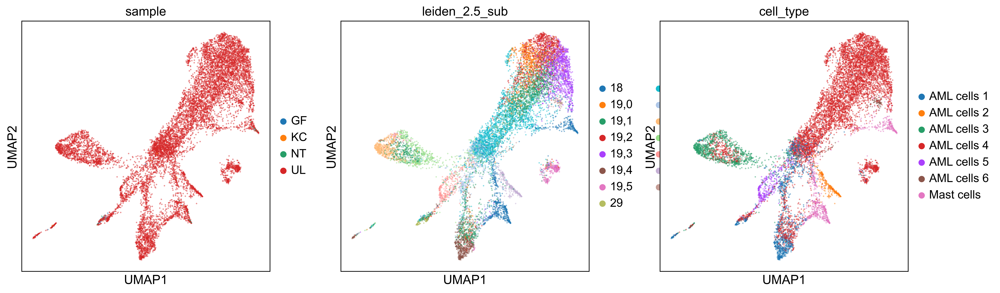

In [48]:
sc.pl.umap(cdata, color = ["sample", "leiden_2.5_sub", "cell_type"], 
           alpha = 0.5, 
           ncols = 3,
           s = 10,
           save = "_bach_correction_2500hvg_5cells_10counts_25neighbors_0.1min_dist_filtered_extra_aml_cells.png")

In [53]:
# saving recovered, batch corrected and filtered umap with optimal parameters before leiden clustering



cdata = cdata.raw.to_adata()
# Saving raw (original) counts to layer
cdata.layers["counts"] = cdata.X.copy()
# Save log-norm into .X
#normalize data
sc.pp.normalize_per_cell(cdata, counts_per_cell_after = 1e4) # n_counts is created
#logaritmize data
sc.pp.log1p(cdata)



fname1 = "backups/aml_cells_umap_%dx%d_%s.h5ad"%(cdata.shape[0],cdata.shape[1],now())
print(fname1)
cdata.write(fname1)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
backups/aml_cells_umap_12062x37733_241028_19h20.h5ad
